# Tests

In [5]:
%display plain
%matplotlib inline

import sys

sys.path.insert(0, "/home/twright/Documents/PhD/Notebooks")

from contextlib import contextmanager
import sys, os

@contextmanager
def suppress_stdout():
    with open(os.devnull, "w") as devnull:
        old_stdout = sys.stdout
        sys.stdout = devnull
        try:  
            yield
        finally:
            sys.stdout = old_stdout
            
            
import warnings
            
@contextmanager
def suppress_warnings():
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        yield

## Example 1: Simple

In [6]:
from flowstar.reachability import Reach
from flowstar.poly import Poly
from ulbc import *

In [7]:
R.<x,y> = RIF[]

In [8]:
system = System(
    R,
    (x,y),
    [(4,5), (1,2)],
    [
        -y,
        x,
    ],
)

In [9]:
system.y

(-y, x)

In [10]:
def mval(x, y):
    val = RIF((var("x")^2 + var("y")^2)({var("x"): x, var("y"): y}))
    if val.upper() < 4:
        return 1
    elif val.lower() > 4:
        return -1
    else:
        return 0

In [11]:
from matplotlib.colors import LinearSegmentedColormap

In [12]:
def f(m):
    return 3*((m + 1)/2)


def finv(m):
    return 2*m/3 - 1

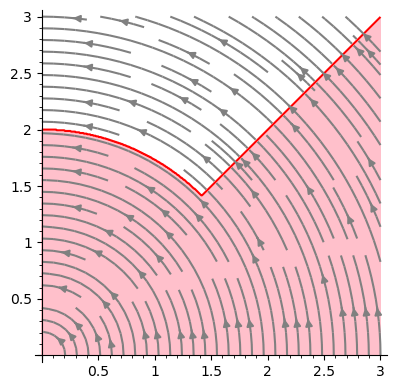

In [13]:
p = streamline_plot(tuple(system.y),(x,0,3),(y,0,3), color='grey')\
    + region_plot((lambda x, y: x^2 + y^2 < 4 or x > y),
                  (x, 0, 3),
                  (y, 0, 3),
                  incol='pink', plot_points=500, bordercol='red')
p.set_aspect_ratio(1)
p.show()

In [ ]:
cs = vector(RIF(1, 2), RIF(0.5, 1))

In [29]:
reach = system.with_y0([RIF(0, 3), RIF(0, 3)]).reach(2*pi, step=0.8, order=15, estimation=1e-5, cutoff_threshold=1e-10, precompose_taylor_models=True)

calling reach with y0 = ['[0.0000000000000000 .. 3.0000000000000000]', '[0.0000000000000000 .. 3.0000000000000000]']
ode in polynomial ring
crude_roots = False
_handle_initials called!
vars = [x, y]
C = [0.0..3.0]
C = [0.0..3.0]
assigning system with dimension 2
resulting system has dimension 2
run within tmv args
integrationScheme = 2


In [30]:
def rval(t0, x, y, symbolic_composition=False):
    #print(f"x = {x.str(style='brackets')}; y = {y.str(style='brackets')}")
    x = finv(x)
    y = finv(y)
    #print(f"x' = {x.str(style='brackets')}; y' = {y.str(style='brackets')}")
    with suppress_stdout():
        obs = PolyObserver(R(4 - var("x")^2 - var("y")^2), reach, symbolic_composition=symbolic_composition)
        robs = RestrictedObserver(obs, [x, y])
        res = robs(t0)
    if res.lower() > 0:
        return 1
    elif res.upper() < 0:
        return -1
    else:
        return 0

In [31]:
@interact
def _(N=slider(1,10, step_size=1, default=1), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), auto_update=False):
    colors = ['pink', 'white', 'lightgreen']
    cm = LinearSegmentedColormap.from_list('ternary colors', colors, N=3)
    n = 2**N
    step = 3 / n
    step_lim = 3/max(n, 8)
    from matplotlib import ticker
    ticks = srange(-0.5, n, n/min(n, 8), include_endpoint=True)
    gridlines = srange(0.5, n-0.5, 1)
    tick_formatter = ticker.FuncFormatter(lambda k, _: '{0:.2f}'.format(
        -1 + 2 * (k + 0.5) / n))
    return matrix_plot(Matrix([[rval(t0*pi, RIF(x, x+step),RIF(y, y+step), symbolic_composition=symbolic_composition) for x in srange(0, 3, step)] for y in srange(0, 3, step)]), cmap=cm, tick_formatter=(tick_formatter, tick_formatter), ticks=(ticks, ticks), gridlines=(gridlines, gridlines), origin='lower')

Manual interactive function <function _ at 0x7fb94bd27430> with 3 widgets
  N: TransformIntSlider(value=1, des…

In [32]:
def rval2(t0, x, y, symbolic_composition=False):
    print(f"x = {x.str(style='brackets')}; y = {y.str(style='brackets')}")
    x = finv(x)
    y = finv(y)
    print(f"x' = {x.str(style='brackets')}; y' = {y.str(style='brackets')}")
    with suppress_stdout():
        obs = PolyObserver(R(4 - var("x")^2 - var("y")^2), reach, symbolic_composition=symbolic_composition)
        robs = RestrictedObserver(obs, [x, y])
        res = robs.check(t0)
        
    return {
        True: 1,
        None: 0,
        False: -1,
    }[res]

In [33]:
@interact
def _(N=slider(1,10, step_size=1, default=1), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), auto_update=False):
    colors = ['pink', 'white', 'lightgreen']
    cm = LinearSegmentedColormap.from_list('ternary colors', colors, N=3)
    n = 2**N
    step = 3 / n
    step_lim = 3/max(n, 8)
    from matplotlib import ticker
    ticks = srange(-0.5, n, n/min(n, 8), include_endpoint=True)
    gridlines = srange(0.5, n-0.5, 1)
    tick_formatter = ticker.FuncFormatter(lambda k, _: '{0:.2f}'.format(
        -1 + 2 * (k + 0.5) / n))
    return matrix_plot(Matrix([[rval2(t0*pi, RIF(x, x+step),RIF(y, y+step), symbolic_composition=symbolic_composition) for x in srange(0, 3, step)] for y in srange(0, 3, step)]), cmap=cm, tick_formatter=(tick_formatter, tick_formatter), ticks=(ticks, ticks), gridlines=(gridlines, gridlines), origin='lower')

Manual interactive function <function _ at 0x7fb93b97c700> with 3 widgets
  N: TransformIntSlider(value=1, des…

In [34]:
def rval3(t0, x, y, symbolic_composition=False):
    print(f"x = {x.str(style='brackets')}; y = {y.str(style='brackets')}")
    with suppress_stdout():
        rch = system.with_y0([x, y]).reach(2*pi, step=0.8, order=15, estimation=1e-5, cutoff_threshold=1e-10, precompose_taylor_models=True, symbolic_composition=symbolic_composition)
        obs = PolyObserver(R(4 - var("x")^2 - var("y")^2), rch, symbolic_composition=symbolic_composition)
        res = obs.check(t0)
        
    return {
        True: 1,
        None: 0,
        False: -1,
    }[res]

In [35]:
@interact
def _(N=slider(1,10, step_size=1, default=1), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), auto_update=False):
    colors = ['pink', 'white', 'lightgreen']
    cm = LinearSegmentedColormap.from_list('ternary colors', colors, N=3)
    n = 2**N
    step = 3 / n
    step_lim = 3/max(n, 8)
    from matplotlib import ticker
    ticks = srange(-0.5, n, n/min(n, 8), include_endpoint=True)
    gridlines = srange(0.5, n-0.5, 1)
    tick_formatter = ticker.FuncFormatter(lambda k, _: '{0:.2f}'.format(
        -1 + 2 * (k + 0.5) / n))
    return matrix_plot(Matrix([[rval3(t0*pi, RIF(x, x+step),RIF(y, y+step), symbolic_composition=symbolic_composition) for x in srange(0, 3, step)] for y in srange(0, 3, step)]), cmap=cm, tick_formatter=(tick_formatter, tick_formatter), ticks=(ticks, ticks), gridlines=(gridlines, gridlines), origin='lower')

Manual interactive function <function _ at 0x7fb93b8cddc0> with 3 widgets
  N: TransformIntSlider(value=1, des…

In [36]:
csig1 = Atomic(var("x")^2 + var("y")^2 < 4).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=True,
    restriction_method=RestrictionMethod.SYMBOLIC,
)
csig2 = Atomic(var("x")^2 + var("y")^2 < 4).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=False,
    restriction_method=RestrictionMethod.SYMBOLIC,
)

==> calling context signal
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <ulbc.context_signals.ReachTree object at 0x7fb93b8ab6d0>
calling reach with y0 = ['[0.0000000000000000 .. 3.0000000000000000]', '[0.0000000000000000 .. 3.0000000000000000]']
ode in polynomial ring
crude_roots = False
_handle_initials called!
vars = [x, y]
C = [0.0..3.0]
C = [0.0..3.0]
contexts = ['[0.0..3.0]', '[0.0..3.0]']
statics  = []
assigning system with dimension 2
resulting system has dimension 2
run within tmv args
integrationScheme = 2
recomputing reachset
PolyObserver(-x^2 - y^2 + 4, <flowstar.reachability.Reach object at 0x7fb94bd0eba0>, 0, symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObse

In [37]:
@interact
def _(N=slider(1,10, step_size=1, default=4), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), auto_update=False):
    csig = csig1 if symbolic_composition else csig2
    with suppress_stdout():
        return csig.G(t0*pi).plot_histogram2d(N)

Manual interactive function <function _ at 0x7fb93b8cd820> with 3 widgets
  N: TransformIntSlider(value=4, des…

In [38]:
def g(m):
    return [[QQ(w) for w in s.endpoints()] for s in m]

In [39]:
matrix(2, 2, [1, 2, 3, 4])

[1 2]
[3 4]

In [40]:
csig1.top_level_domain

[1.?e1, 1.?e1]

In [41]:
g(csig1.absolute_space_domain)

[[0, 3], [0, 3]]

In [42]:
g(csig1.symbolic_space_domain)

[[-1, 1], [-1, 1]]

In [43]:
[g(m.symbolic_space_domain) for m in csig1.children]

 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b6be040>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.19 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1,), signal = functools.partial(<bound method Atomic.signa

[[[-1, 0], [-1, 0]], [[-1, 0], [0, 1]], [[0, 1], [-1, 0]], [[0, 1], [0, 1]]]

In [44]:
[g(m.symbolic_space_domain) for m in csig1.children[1].children]

 ==> creating ContextSignal with coord=(1, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93baf75e0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.20 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1), signal = functools.partial(<bound method Atomic

[[[-1, -1/2], [0, 1/2]],
 [[-1, -1/2], [1/2, 1]],
 [[-1/2, 0], [0, 1/2]],
 [[-1/2, 0], [1/2, 1]]]

In [45]:
[g(m.symbolic_space_domain) for m in csig1.children[1].children[1].children]

 ==> creating ContextSignal with coord=(1, 1, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b594280>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.09 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, symbolic_composition=True, o

[[[-1, -3/4], [1/2, 3/4]],
 [[-1, -3/4], [3/4, 1]],
 [[-3/4, -1/2], [1/2, 3/4]],
 [[-3/4, -1/2], [3/4, 1]]]

In [46]:
csig1.children[0].children[0].signal

 ==> creating ContextSignal with coord=(0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b5944c0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, symbolic_composition=True, order=10, s

Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None)

In [47]:
g(csig1.children[0].children[0].symbolic_space_domain)

[[-1, -1/2], [-1, -1/2]]

In [48]:
g(csig1.children[0].children[0].absolute_space_domain)

[[0, 3], [0, 3]]

In [49]:
csig1.coordinate

()

In [50]:
csig1.children[0].children[0].coordinate

(0, 0)

In [51]:
g(csig1.children[2].children[1].symbolic_space_domain)

 ==> creating ContextSignal with coord=(2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b6be040>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.31 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1), signal = functools.partial(<bound method Atomic

[[0, 1/2], [-1/2, 0]]

In [52]:
csig1.children[2].children[1].signal

Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None)

In [53]:
csig1.children[2].children[1].signal(0)

In [54]:
csig1 = (Atomic(var("x")^2 + var("y")^2 < 4) | Atomic(var("x") > var("y"))).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=True,
    restriction_method=RestrictionMethod.SYMBOLIC,
)
csig2 = (Atomic(var("x")^2 + var("y")^2 < 4) | Atomic(var("x") > var("y"))).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=False,
    restriction_method=RestrictionMethod.SYMBOLIC,
)

==> calling context signal
 ==> creating ContextSignal with coord=(), signal = <function base_context_signal.<locals>.<lambda> at 0x7fb93ba30310>, reach_tree = None
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <ulbc.context_signals.ReachTree object at 0x7fb93b54ee50>
calling reach with y0 = ['[0.0000000000000000 .. 3.0000000000000000]', '[0.0000000000000000 .. 3.0000000000000000]']
ode in polynomial ring
crude_roots = False
_handle_initials called!
vars = [x, y]
C = [0.0..3.0]
C = [0.0..3.0]
contexts = ['[0.0..3.0]', '[0.0..3.0]']
statics  = []
assigning system with dimension 2
resulting system has dimension 2
run within tmv args
integrationScheme = 2
recomputing reachset
PolyObserver(-x^2 - y^2 + 4, <flowstar.reachability.Reach object at 0x7fb93b664ba0>, 0, symbolic_composition=

In [55]:
@interact
def _(N=slider(1,10, step_size=1, default=4), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), auto_update=False):
    csig = csig1 if symbolic_composition else csig2
    with suppress_stdout():
        return csig.G(t0*pi).plot_histogram2d(N)

Manual interactive function <function _ at 0x7fb93b586d30> with 3 widgets
  N: TransformIntSlider(value=4, des…

In [56]:
a = animate(
    [csig1.G(t0*pi).plot_histogram2d(4)
         + text(f"t = {t0}$\\pi$", (5, 0.4))
     for t0 in srange(0, 2, 0.01)])

 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0,), signal = <function base_context_signal.<locals>.<lambda> at 0x7fb93ba30310>, reach_tree = None
 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b487ca0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.18 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785

top-level root detection: 1 items in 0.03 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1), signal = <func

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b41f940>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.336

top-level root detection: 1 items in 0.02 seconds
roots = [[0.0000000000000000 .. 0.33684044773832117], [2.7999999999999891 .. 3.5000000000000032], [5.9515666539940017 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 0.33684044773832117], 
 [2.7999999999999891 .. 3.5000000000000032], 
 [5.9515666539940017 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 0.33684044773832117], 
 [2.7999999999999891 .. 3.5000000000000032], 
 [5.9515666539940017 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], Tru

top-level root detection: 1 items in 0.01 seconds
roots = [[2.5959739215281958 .. 2.9522719010185133], [5.7368075920103898 .. 6.1000000000000148]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.5959739215281958 .. 2.9522719010185133], 
 [5.7368075920103898 .. 6.1000000000000148]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[2.5959739215281958 .. 2.9522719010185133], 
 [5.7368075920103898 .. 6.1000000000000148]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], 

 [3.4557597579674519 .. 3.6563621834196476]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.31213254042275467 .. 0.50818354400650157], 
 [3.4557597579674519 .. 3.6563621834196476]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 3, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 3, 1), signal = <function base_context_signal.<locals>.<lambda> at 0x7fb93ba30310>, reach_tree = None
 ==> creat

top-level root detection: 1 items in 0.17 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b2dab80>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 ..

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b2e3040>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000

top-level root detection: 1 items in 0.12 seconds
roots = [[0.39999999999999980 .. 1.4000000000000011], [1.9999999999999955 .. 2.9000000000000026], [3.4999999999999835 .. 4.5000000000000063], [5.0999999999999658 .. 6.1000000000000148]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.39999999999999980 .. 1.4000000000000011], 
 [1.9999999999999955 .. 2.9000000000000026], 
 [3.4999999999999835 .. 4.5000000000000063], 
 [5.0999999999999658 .. 6.1000000000000148]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.39999999999999980 .. 1.4000000000000011], 
 [1.9999999999999955 .. 2.9000000000000026], 
 [3.4999999999999835 .. 4.5000000000000063], 
 [5.0999999999999658 .. 6.1000000000000148]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 0.39999999999999981], False), ([1.4000000000000010 .. 1.9999999999999956], False), ([2.9000

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 1), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b2a7040>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[2.3458920054827290 ..

top-level root detection: 1 items in 0.12 seconds
roots = [[0.39999999999999980 .. 1.5000000000000012], [1.9999999999999955 .. 3.0000000000000027], [3.4999999999999835 .. 4.6000000000000068], [5.0999999999999658 .. 6.2000000000000153]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.39999999999999980 .. 1.5000000000000012], 
 [1.9999999999999955 .. 3.0000000000000027], 
 [3.4999999999999835 .. 4.6000000000000068], 
 [5.0999999999999658 .. 6.2000000000000153]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.39999999999999980 .. 1.5000000000000012], 
 [1.9999999999999955 .. 3.0000000000000027], 
 [3.4999999999999835 .. 4.6000000000000068], 
 [5.0999999999999658 .. 6.2000000000000153]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 0.39999999999999981], True), ([1.5000000000000011 .. 1.9999999999999956], True), ([3.

 ==> creating ContextSignal with coord=(1, 0, 1, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([2.5545553326722090 .. 5.5877758863906611], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 1, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([2.5545553326722090 .. 5.5877758863906611], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = <function base_context_signal.<locals>.<lambda> at 0x7fb93ba30310>, reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 1, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b2a7b80>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0

top-level root detection: 1 items in 0.17 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 2, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b2daee0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[2.6459672474586

top-level root detection: 1 items in 0.04 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 1, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b3a63a0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[2.4965134700439484 .. 2.6818883908067997], [5.6368976113811415 .. 5.8205576758318350]]
domain = 

top-level root detection: 1 items in 0.17 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb94be0e5e0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[2.7296687579344927 ..

top-level root detection: 1 items in 0.17 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 0, 1), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 0, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b4db5e0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[2.7335086513106

top-level root detection: 1 items in 0.10 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 1, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 1, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93bd67940>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[2.7799882167509646 .. 2.9000000000000026], [5.9203088931769753 .. 6.0399732210667807]]
dom

top-level root detection: 1 items in 0.15 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 2, 1), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93bd4ddc0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[2.8923571374295842 .. 3.0182224944827661], [6.0348227710211910 .. 6.1622178845314331]]
dom

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb94bd6b040>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.28631292245131328 .. 0.80

top-level root detection: 1 items in 0.13 seconds
roots = [[0.099999999999999991 .. 1.4000000000000011], [1.6999999999999966 .. 3.0000000000000027], [3.2999999999999851 .. 4.5000000000000063], [4.7999999999999696 .. 6.1000000000000148]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.099999999999999991 .. 1.4000000000000011], 
 [1.6999999999999966 .. 3.0000000000000027], 
 [3.2999999999999851 .. 4.5000000000000063], 
 [4.7999999999999696 .. 6.1000000000000148]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.099999999999999991 .. 1.4000000000000011], 
 [1.6999999999999966 .. 3.0000000000000027], 
 [3.2999999999999851 .. 4.5000000000000063], 
 [4.7999999999999696 .. 6.1000000000000148]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 0.099999999999999992], True), ([1.4000000000000010 .. 1.6999999999999967], True), ([3

top-level root detection: 1 items in 0.10 seconds
roots = [[0.29999999999999987 .. 1.3000000000000010], [1.8999999999999959 .. 2.8000000000000025], [3.4999999999999835 .. 4.4000000000000057], [4.9999999999999671 .. 6.0000000000000143]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.29999999999999987 .. 1.3000000000000010], 
 [1.8999999999999959 .. 2.8000000000000025], 
 [3.4999999999999835 .. 4.4000000000000057], 
 [4.9999999999999671 .. 6.0000000000000143]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.29999999999999987 .. 1.3000000000000010], 
 [1.8999999999999959 .. 2.8000000000000025], 
 [3.4999999999999835 .. 4.4000000000000057], 
 [4.9999999999999671 .. 6.0000000000000143]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 0, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 0.29999999999999988], True), ([1.3000000000000009 .. 1.8999999999999960], True), ([2.

top-level root detection: 1 items in 0.15 seconds
roots = [[0.0000000000000000 .. 1.3000000000000010], [1.4999999999999973 .. 2.9000000000000026], [2.9999999999999875 .. 4.4000000000000057], [4.5999999999999721 .. 6.0000000000000143], [6.1999999999999522 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 1.3000000000000010], 
 [1.4999999999999973 .. 2.9000000000000026], 
 [2.9999999999999875 .. 4.4000000000000057], 
 [4.5999999999999721 .. 6.0000000000000143], 
 [6.1999999999999522 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 1.3000000000000010], 
 [1.4999999999999973 .. 2.9000000000000026], 
 [2.9999999999999875 .. 4.4000000000000057], 
 [4.5999999999999721 .. 6.0000000000000143], 
 [6.1999999999999522 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 1, 2), signal = Signal([0.0000000000000000 .

top-level root detection: 1 items in 0.13 seconds
roots = [[0.099999999999999991 .. 1.4000000000000011], [1.6999999999999966 .. 2.9000000000000026], [3.2999999999999851 .. 4.5000000000000063], [4.7999999999999696 .. 6.1000000000000148]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.099999999999999991 .. 1.4000000000000011], 
 [1.6999999999999966 .. 2.9000000000000026], 
 [3.2999999999999851 .. 4.5000000000000063], 
 [4.7999999999999696 .. 6.1000000000000148]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.099999999999999991 .. 1.4000000000000011], 
 [1.6999999999999966 .. 2.9000000000000026], 
 [3.2999999999999851 .. 4.5000000000000063], 
 [4.7999999999999696 .. 6.1000000000000148]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 0.099999999999999992], False), ([1.4000000000000010 .. 1.6999999999999967], False)

top-level root detection: 1 items in 0.11 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b87f700>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.51377771922633874 .. 0.62206092268194347], [3.6558685050046570 .. 3.7675301180601140]]
d

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b523820>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.23619272561586501 .

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b246b80>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.1900484254387

top-level root detection: 1 items in 0.16 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b171700>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.3161148796130

top-level root detection: 1 items in 0.08 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(2, 2, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b110940>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.61058115416919378 .. 0.80000000000000038], [3.7530278853587577 .. 3.9315940816503967]]
domain 

top-level root detection: 1 items in 0.15 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b06f4c0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.01 seconds
roots = [[0.0000000000000000 .. 0.20000000000000002], [2.9322983514107305 .. 3.3509616424048745], [6.07434481280

top-level root detection: 1 items in 0.07 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93b0b0700>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = [[0.0000000000000000 .. 0.062728998390195260], [3.0783140582446599 .. 3.2003715397608974], [

 ==> creating ContextSignal with coord=(3, 2, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = None
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7fb93af97ca0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.00 seconds
roots = []
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = []
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3, 2, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [([0.0000000000000000 .. 6.2831853071795872], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbol

 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 6.2517693806436885], [([0.0000000000000000 .. 6.2517693806436885], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 6.2517693806436885], [([0.0000000000000000 .. 6.2517693806436885], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 6.2517693806436885], [([0.0000000000000000 .. 6.2517693806436885], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 6.2517693806436885], [([0.0000000000000000 .. 6.2517693806436885], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 6.2517693806436885], [([0.0000000000000000 .. 6.2517693806436885], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(1, 2, 2, 1), signal = Signal([0.0000000000000000 .. 6.1889375275718930], [([0.0000000000000000 .. 2.7981093578218901], False), ([2.9239747148750723 .. 5.9405749914134969], True), ([6.0679701049237397 .. 6.1889375275718930], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 2, 2), signal = Signal([0.0000000000000000 .. 6.1889375275718930], [([3.0501566856346387 .. 6.0615608090121960], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 2, 3), signal = Signal([0.0000000000000000 .. 6.1889375275718930], [([0.0000000000000000 .. 2.8696057745947932], False), ([2.9935272465883007 .. 6.0084066239975105], True), ([6.1316181464326309 .. 6.1889375275718930], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 6.1889375275718930], [([0.0000000000000000 .. 2.7592733353499344], False), ([2.8759985804701089 .. 5.8991

 ==> creating ContextSignal with coord=(3, 3, 2, 1), signal = Signal([0.0000000000000000 .. 6.1261056745000975], [([0.0000000000000000 .. 2.9822983134583998], False), ([3.0563333621569372 .. 6.1230645215720721], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 2, 2), signal = Signal([0.0000000000000000 .. 6.1261056745000975], [([0.0000000000000000 .. 3.0525212464959300], False), ([3.1299816467321952 .. 6.1261056745000966], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 2, 3), signal = Signal([0.0000000000000000 .. 6.1261056745000975], [([0.0000000000000000 .. 3.0162040653382821], False), ([3.0893697322414532 .. 6.1261056745000966], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 3, 0), signal = Signal([0.0000000000000000 .. 6.1261056745000975], [([0.0000000000000000 .. 2.9472055405832812], False), ([3.0218471135115674 .. 6.0900501385617086], True)], mask=None), reach_tree = None


 ==> creating ContextSignal with coord=(3, 2, 1, 0), signal = Signal([0.0000000000000000 .. 6.0946897479641989], [([0.0000000000000000 .. 2.9926347546421819], False), ([3.0865182226443872 .. 6.0946897479641989], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 1, 1), signal = Signal([0.0000000000000000 .. 6.0946897479641989], [([0.0000000000000000 .. 2.9504989127311188], False), ([3.0374096297945842 .. 6.0911739199713662], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 1, 2), signal = Signal([0.0000000000000000 .. 6.0946897479641989], [([0.0000000000000000 .. 3.0327315406642322], False), ([3.1185814129255526 .. 6.0946897479641989], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 6.0946897479641989], [([0.0000000000000000 .. 2.9896200757628102], False), ([3.0754089032510414 .. 6.0946897479641989], True)], mask=None), reach_tree = None


 ==> creating ContextSignal with coord=(1, 0, 2), signal = Signal([0.0000000000000000 .. 6.0004419683565056], [([2.5393069079606713 .. 5.4092002032096147], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 3), signal = Signal([0.0000000000000000 .. 6.0004419683565056], [([2.4566561630077741 .. 5.3786778509978790], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 0, 0), signal = Signal([0.0000000000000000 .. 6.0004419683565056], [([0.0000000000000000 .. 6.0004419683565056], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 0, 1), signal = Signal([0.0000000000000000 .. 6.0004419683565056], [([0.0000000000000000 .. 0.11725666117691836], True), ([1.0172566611769195 .. 1.7172566611769141], True), ([2.1847660652022002 .. 5.2045782887806534], True), ([5.7172566611769335 .. 6.0004419683565056], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 0, 2), signal =

 ==> creating ContextSignal with coord=(1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([0.0000000000000000 .. 2.4214413662157380], False), ([2.5018853992529823 .. 5.5611246503799832], True), ([5.6446278516556507 .. 5.9376101152847092], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([3.5954466526663817 .. 5.9376101152847092], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([3.2619254140708227 .. 5.9208708737674698], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2), signal = Signal([0.0000000000000000 .. 5.9376101152847092], [([0.0000000000000000 .. 0.10269338659591921], True), ([0.75442480810512346 .. 1.4544248081051190], False), ([2.3544248081051253 .. 2.9544248081051077], False), ([3.5906904588347128 .. 5.9376101152847092], Tr

 ==> creating ContextSignal with coord=(3, 2, 0), signal = Signal([0.0000000000000000 .. 5.8747782622129137], [([0.0000000000000000 .. 2.8166421328523895], False), ([3.0003884202170696 .. 5.8747782622129137], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 1), signal = Signal([0.0000000000000000 .. 5.8747782622129137], [([0.0000000000000000 .. 2.7277563857993017], False), ([2.8990402991131780 .. 5.8681812646562888], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 2), signal = Signal([0.0000000000000000 .. 5.8747782622129137], [([0.0000000000000000 .. 2.8888688012145801], False), ([3.0622429493674521 .. 5.8747782622129137], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 5.8747782622129137], [([0.0000000000000000 .. 2.8027730831115823], False), ([2.9669852490281320 .. 5.8747782622129137], True)], mask=None), reach_tree = None
 ==> creatin

 ==> creating ContextSignal with coord=(1, 3, 0), signal = Signal([0.0000000000000000 .. 5.7805304826052196], [([0.0000000000000000 .. 2.1272447352849211], False), ([2.3186043808673599 .. 5.2707107051812799], True), ([5.4631566980764914 .. 5.7805304826052196], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 5.7805304826052196], [([0.0000000000000000 .. 2.0960411070100547], False), ([2.2617206376824299 .. 5.2375280883659477], True), ([5.4001701716702168 .. 5.7805304826052196], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 2), signal = Signal([0.0000000000000000 .. 5.7805304826052196], [([0.0000000000000000 .. 2.2554750297492952], False), ([2.4452553251531083 .. 5.3952232148399464], True), ([5.5903819490386075 .. 5.7805304826052196], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.780530482

 ==> creating ContextSignal with coord=(), signal = Signal([0.0000000000000000 .. 5.6862827029975263], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0,), signal = Signal([0.0000000000000000 .. 5.6862827029975263], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 5.6862827029975263], [([2.5928400812302943 .. 4.7992045034478528], True), ([4.8030973958179510 .. 4.8493521166701843], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 5.6862827029975263], [([3.3589830117136543 .. 5.6587737602448094], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 5.6862827029975263], [([0.0000000000000000 .. 2.2030973958179283], False), ([2.9030973958179426 .. 5.3546640503292365], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0), signa

 ==> creating ContextSignal with coord=(0, 1, 2), signal = Signal([0.0000000000000000 .. 5.6548667764616277], [([0.0000000000000000 .. 5.6548667764616277], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 3), signal = Signal([0.0000000000000000 .. 5.6548667764616277], [([0.0000000000000000 .. 5.6548667764616277], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 0, 0), signal = Signal([0.0000000000000000 .. 5.6548667764616277], [([0.0000000000000000 .. 5.6548667764616277], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 0, 1), signal = Signal([0.0000000000000000 .. 5.6548667764616277], [([0.0000000000000000 .. 5.6548667764616277], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 0, 2), signal = Signal([0.0000000000000000 .. 5.6548667764616277], [([0.0000000000000000 .. 5.6548667764616277], True)], mask=None), reach_tree = None
 ==> creating Context

 ==> creating ContextSignal with coord=(3, 2, 1, 3), signal = Signal([0.0000000000000000 .. 5.5920349233898322], [([0.0000000000000000 .. 2.4869652511884435], False), ([2.5727540786766742 .. 5.5920349233898322], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 2, 0), signal = Signal([0.0000000000000000 .. 5.5920349233898322], [([0.0000000000000000 .. 2.6617852524982207], False), ([2.7479474132834544 .. 5.5920349233898322], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 5.5920349233898322], [([0.0000000000000000 .. 2.6116385606491206], False), ([2.7000498881563630 .. 5.5920349233898322], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 2, 2), signal = Signal([0.0000000000000000 .. 5.5920349233898322], [([0.0000000000000000 .. 2.6910897459367780], False), ([2.7756305459889603 .. 5.5920349233898322], True)], mask=None), reach_tree = None


 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 5.4977871437821380], [([2.0394463424483224 .. 4.6788606164897715], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 5.4977871437821380], [([0.61460183660255240 .. 1.2146018366025471], False), ([1.9009753605889341 .. 4.6869779530086522], True), ([5.3146018366025664 .. 5.4977871437821380], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 5.4977871437821380], [([2.3705258071930046 .. 5.0146018366025081], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 5.4977871437821380], [([0.0000000000000000 .. 1.8105757581330460], False), ([2.1668737376148290 .. 4.9514094287214121], True), ([5.3146018366025664 .. 5.4977871437821380], False)], mask=None), reach_tree = None
 ==> creating ContextSi

 ==> creating ContextSignal with coord=(3, 1, 3, 2), signal = Signal([0.0000000000000000 .. 5.4349552907103425], [([0.0000000000000000 .. 2.1377746932537747], False), ([2.2189920822200730 .. 5.2796532361584508], True), ([5.3584183989484008 .. 5.4349552907103425], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 5.4349552907103425], [([0.0000000000000000 .. 2.1085725286605368], False), ([2.1837511590787932 .. 5.2489983806560927], True), ([5.3267618499646252 .. 5.4349552907103425], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0), signal = Signal([0.0000000000000000 .. 5.4349552907103425], [([0.0000000000000000 .. 2.3768191613498178], False), ([2.5605654487144984 .. 5.4349552907103425], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 1), signal = Signal([0.0000000000000000 .. 5.4349552907103425], [([0.0000000000000000 .. 2.2879334142

 ==> creating ContextSignal with coord=(1, 3, 0), signal = Signal([0.0000000000000000 .. 5.3407075111026483], [([0.0000000000000000 .. 1.6874217637823501], False), ([1.8787814093647885 .. 4.8308877336787087], True), ([5.0233337265739201 .. 5.3407075111026483], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 5.3407075111026483], [([0.0000000000000000 .. 1.6562181355074837], False), ([1.8218976661798584 .. 4.7977051168633765], True), ([4.9603472001676456 .. 5.3407075111026483], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 2), signal = Signal([0.0000000000000000 .. 5.3407075111026483], [([0.0000000000000000 .. 1.8156520582467242], False), ([2.0054323536505371 .. 4.9554002433373752], True), ([5.1505589775360363 .. 5.3407075111026483], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 5.340707511

 ==> creating ContextSignal with coord=(0, 0, 2, 0), signal = Signal([0.0000000000000000 .. 5.2464597314949551], [([0.0000000000000000 .. 5.2464597314949542], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 2, 1), signal = Signal([0.0000000000000000 .. 5.2464597314949551], [([0.0000000000000000 .. 5.2464597314949542], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 2, 2), signal = Signal([0.0000000000000000 .. 5.2464597314949551], [([0.0000000000000000 .. 5.2464597314949542], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 2, 3), signal = Signal([0.0000000000000000 .. 5.2464597314949551], [([0.0000000000000000 .. 5.2464597314949542], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 3, 0), signal = Signal([0.0000000000000000 .. 5.2464597314949551], [([0.0000000000000000 .. 5.2464597314949542], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(2, 3, 2, 0), signal = Signal([0.0000000000000000 .. 5.1836278784231587], [([0.0000000000000000 .. 2.4790816603991340], False), ([2.5714151811739172 .. 5.1836278784231587], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 5.1836278784231587], [([0.0000000000000000 .. 2.4184716673928706], False), ([2.5060183487036691 .. 5.1836278784231587], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 2, 2), signal = Signal([0.0000000000000000 .. 5.1836278784231587], [([0.0000000000000000 .. 2.4995357860178134], False), ([2.5004425712435751 .. 2.5019473104455568], False), ([2.5878326622528393 .. 5.1836278784231587], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 5.1836278784231587], [([0.0000000000000000 .. 2.4438258994098408], False), ([2.5260245550308884 .. 5.1836

 ==> creating ContextSignal with coord=(1, 0, 3, 3), signal = Signal([0.0000000000000000 .. 5.1522119518872609], [([0.0000000000000000 .. 1.4685746958381061], False), ([1.5741409637632082 .. 4.6101405203811466], True), ([4.7169577773606361 .. 5.1522119518872609], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1, 0), signal = Signal([0.0000000000000000 .. 5.1522119518872609], [([0.0000000000000000 .. 1.2166544810319886], False), ([1.3909423442655826 .. 4.3520334511864168], True), ([4.5335201913665192 .. 5.1522119518872609], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1, 1), signal = Signal([0.0000000000000000 .. 5.1522119518872609], [([0.0000000000000000 .. 1.2178899720858878], False), ([1.3686698480362653 .. 4.3538268968239998], True), ([4.5094539502360522 .. 5.1522119518872609], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1, 2), signal = Signal([0.0000000000000000 .. 5.152211

 ==> creating ContextSignal with coord=(1, 2, 3, 0), signal = Signal([0.0000000000000000 .. 5.0893800988154654], [([0.0000000000000000 .. 1.6597159065935068], False), ([1.7764411517136808 .. 4.7995904307222972], True), ([4.9151281533949893 .. 5.0893800988154654], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 3, 1), signal = Signal([0.0000000000000000 .. 5.0893800988154654], [([0.0000000000000000 .. 1.6218901444187784], False), ([1.7301049751985879 .. 4.7656387468950375], True), ([4.8734912690934155 .. 5.0893800988154654], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 3, 2), signal = Signal([0.0000000000000000 .. 5.0893800988154654], [([0.0000000000000000 .. 1.7248472813352871], False), ([1.8387274649523521 .. 4.8681167369502303], True), ([4.9824942621065808 .. 5.0893800988154654], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 3, 3), signal = Signal([0.0000000000000000 ..

 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 4.9951323192077713], [([0.0000000000000000 .. 4.9951323192077704], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 4.9951323192077713], [([0.0000000000000000 .. 4.9951323192077704], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 4.9951323192077713], [([0.0000000000000000 .. 4.9951323192077704], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 4.9951323192077713], [([0.0000000000000000 .. 4.9951323192077704], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 4.9951323192077713], [([0.0000000000000000 .. 4.9951323192077704], True)], mask=None), reach_tree = None
 ==> creating Cont

 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 4.9323004661359749], [([0.0000000000000000 .. 2.5010085036577179], False), ([2.5780712594999606 .. 4.9323004661359749], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 2, 1), signal = Signal([0.0000000000000000 .. 4.9323004661359749], [([0.0000000000000000 .. 2.4282536420263763], False), ([2.5140131951438160 .. 4.9323004661359749], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 4.9323004661359749], [([0.0000000000000000 .. 2.5056387888190926], False), ([2.5779398895016507 .. 4.9323004661359749], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 4.9323004661359749], [([0.0000000000000000 .. 2.4372720883890966], False), ([2.5181641230657372 .. 4.9323004661359749], True)], mask=None), reach_tree = None


 ==> creating ContextSignal with coord=(1, 0, 0, 2), signal = Signal([0.0000000000000000 .. 4.8380526865282816], [([0.0000000000000000 .. 4.8380526865282807], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 0, 3), signal = Signal([0.0000000000000000 .. 4.8380526865282816], [([0.054867379348695566 .. 0.55486737934868958], True), ([1.1313745801509833 .. 4.1516534314827541], True), ([4.7548673793487097 .. 4.8380526865282807], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 1, 0), signal = Signal([0.0000000000000000 .. 4.8380526865282816], [([1.0111824996092146 .. 4.0431089384791417], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 1, 1), signal = Signal([0.0000000000000000 .. 4.8380526865282816], [([0.0000000000000000 .. 0.35486737934869073], False), ([1.0020405749316187 .. 4.0438768029990780], True), ([4.7548673793487097 .. 4.8380526865282816], False)], mask=None), reach_tree = Non

 ==> creating ContextSignal with coord=(3, 2, 3, 0), signal = Signal([0.0000000000000000 .. 4.7752208334564852], [([0.0000000000000000 .. 1.7504056105700157], False), ([1.8329418247456206 .. 4.7752208334564852], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 4.7752208334564852], [([0.0000000000000000 .. 1.7068913134467217], False), ([1.7906757154773997 .. 4.7752208334564852], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 3, 2), signal = Signal([0.0000000000000000 .. 4.7752208334564852], [([0.0000000000000000 .. 1.7820490707936228], False), ([1.8637399628684692 .. 4.7752208334564852], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 3, 3), signal = Signal([0.0000000000000000 .. 4.7752208334564852], [([0.0000000000000000 .. 1.7422378458418191], False), ([1.8178452547119978 .. 4.7752208334564852], True)], mask=None), reach_tree = None


 ==> creating ContextSignal with coord=(2, 2, 1, 0), signal = Signal([0.0000000000000000 .. 4.6809730538487920], [([0.0000000000000000 .. 2.0734828258014817], False), ([2.1784741554935798 .. 4.6809730538487911], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 1, 1), signal = Signal([0.0000000000000000 .. 4.6809730538487920], [([0.0000000000000000 .. 1.9953766281369525], False), ([2.0979948419495646 .. 4.6809730538487911], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 1, 2), signal = Signal([0.0000000000000000 .. 4.6809730538487920], [([0.0000000000000000 .. 2.0906284450678605], False), ([2.1896525495822340 .. 4.6809730538487911], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 1, 3), signal = Signal([0.0000000000000000 .. 4.6809730538487920], [([0.0000000000000000 .. 2.0219985603631972], False), ([2.1148624105985218 .. 4.6809730538487911], True)], mask=None), reach_tree = None


 ==> creating ContextSignal with coord=(0, 3, 0), signal = Signal([0.0000000000000000 .. 4.5867252742410978], [([0.0000000000000000 .. 4.5867252742410978], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 1), signal = Signal([0.0000000000000000 .. 4.5867252742410978], [([0.0000000000000000 .. 0.70353996706150302], True), ([1.4035399670615138 .. 4.2595045596474322], True), ([4.5035399670615268 .. 4.5867252742410978], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 2), signal = Signal([0.0000000000000000 .. 4.5867252742410978], [([0.0000000000000000 .. 0.0035399670615072765], True), ([0.60353996706151313 .. 1.6035399670614959], True), ([1.7836002836454767 .. 4.5867252742410978], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 4.5867252742410978], [([1.6035399670615140 .. 4.4358567050228093], True)], mask=None), reach_tree = None
 ==> creati

 ==> creating ContextSignal with coord=(2, 0, 1, 3), signal = Signal([0.0000000000000000 .. 4.5238934211693023], [([1.8799151767301860 .. 4.5238934211693014], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0, 2, 0), signal = Signal([0.0000000000000000 .. 4.5238934211693023], [([2.1704534575333886 .. 4.5238934211693014], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0, 2, 1), signal = Signal([0.0000000000000000 .. 4.5238934211693023], [([2.0807347250888681 .. 4.5238934211693014], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 4.5238934211693023], [([1.1407081139897172 .. 1.5407081139897004], False), ([2.1702021421801203 .. 4.5238934211693014], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 4.5238934211693023], [([1.0407081139897171 .. 1.4407081139897012], 

 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 4.4296456415616082], [([1.4464603343820241 .. 4.2787770723433188], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 4.4296456415616082], [([0.0000000000000000 .. 4.4296456415616073], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 0, 1), signal = Signal([0.0000000000000000 .. 4.4296456415616082], [([0.0000000000000000 .. 4.4296456415616073], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 4.4296456415616082], [([0.0000000000000000 .. 4.4296456415616073], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 0, 3), signal = Signal([0.0000000000000000 .. 4.4296456415616082], [([0.0000000000000000 .. 4.4296456415616073], True)], mask=None), reach_tree = None
 ==> creating Cont

 ==> creating ContextSignal with coord=(3, 0, 1, 0), signal = Signal([0.0000000000000000 .. 4.3668137884898118], [([0.0000000000000000 .. 1.0649235324924249], False), ([1.1773948775314508 .. 4.2062647162408898], True), ([4.3158454478716707 .. 4.3668137884898118], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 1, 1), signal = Signal([0.0000000000000000 .. 4.3668137884898118], [([0.0000000000000000 .. 1.0254095015728407], False), ([1.1275250060787043 .. 4.1660756246608362], True), ([4.2710997704825182 .. 4.3668137884898118], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 1, 2), signal = Signal([0.0000000000000000 .. 4.3668137884898118], [([0.0000000000000000 .. 1.1226794611905604], False), ([1.2274384830582489 .. 4.2634000704714766], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 1, 3), signal = Signal([0.0000000000000000 .. 4.3668137884898118], [([0.0000000000000000 .. 1.0793

 ==> creating ContextSignal with coord=(0, 2, 0, 2), signal = Signal([0.0000000000000000 .. 4.2725660088821185], [([0.0000000000000000 .. 4.2725660088821176], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 0, 3), signal = Signal([0.0000000000000000 .. 4.2725660088821185], [([0.0000000000000000 .. 4.2725660088821176], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 4.2725660088821185], [([0.0000000000000000 .. 4.2725660088821176], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 4.2725660088821185], [([0.0000000000000000 .. 4.2725660088821176], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 4.2725660088821185], [([0.0000000000000000 .. 4.2725660088821176], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(3, 3, 0, 0), signal = Signal([0.0000000000000000 .. 4.2097341558103230], [([0.0000000000000000 .. 1.0243743097044407], False), ([1.1117403489072685 .. 4.1680807880529658], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 0, 1), signal = Signal([0.0000000000000000 .. 4.2097341558103230], [([0.0000000000000000 .. 0.98908736154220290], False), ([1.0698248654219031 .. 4.1296451865190332], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 0, 2), signal = Signal([0.0000000000000000 .. 4.2097341558103230], [([0.0000000000000000 .. 1.0657504259185933], False), ([1.1457072418842750 .. 4.2064663622044547], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 0, 3), signal = Signal([0.0000000000000000 .. 4.2097341558103230], [([0.0000000000000000 .. 1.0279477803431103], False), ([1.1083660928060070 .. 4.1711215568098670], True)], mask=None), reach_tree = None

 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 4.1154863762026289], [([0.0000000000000000 .. 0.54032487590748746], False), ([0.71259278475723597 .. 3.6866961819810263], True), ([3.8503461016190394 .. 4.1154863762026289], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 0, 0), signal = Signal([0.0000000000000000 .. 4.1154863762026289], [([0.0000000000000000 .. 0.48588446919893791], False), ([0.58480087731192709 .. 3.6265268379047156], True), ([3.7276108115841788 .. 4.1154863762026289], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 0, 1), signal = Signal([0.0000000000000000 .. 4.1154863762026289], [([0.0000000000000000 .. 0.46464504485889880], False), ([0.55628276517132047 .. 3.6069369489042807], True), ([3.6989357513343872 .. 4.1154863762026289], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 0, 2), signal = Signal([0.0000000000000000

 ==> creating ContextSignal with coord=(3, 0, 3, 3), signal = Signal([0.0000000000000000 .. 4.0526545231308325], [([0.0000000000000000 .. 0.86347596374139979], False), ([0.95865180998928023 .. 4.0072007732759661], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 1, 0), signal = Signal([0.0000000000000000 .. 4.0526545231308325], [([0.0000000000000000 .. 0.64037807626640353], False), ([0.82500505860780393 .. 3.7786143136285167], True), ([3.9694692159512601 .. 4.0526545231308325], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 1, 1), signal = Signal([0.0000000000000000 .. 4.0526545231308325], [([0.0000000000000000 .. 0.58290839349313162], False), ([0.75152876080061714 .. 3.7279955031234598], True), ([3.8888178896372704 .. 4.0526545231308325], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 1, 2), signal = Signal([0.0000000000000000 .. 4.0526545231308325], [([0.0000000000000000 .. 0.7409638

 ==> creating ContextSignal with coord=(1, 1, 1, 1), signal = Signal([0.0000000000000000 .. 3.9584067435231392], [([0.0000000000000000 .. 0.027799703921266961], False), ([0.098073269717478872 .. 3.1663483915451165], True), ([3.2397591497703368 .. 3.9584067435231392], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1, 1, 2), signal = Signal([0.0000000000000000 .. 3.9584067435231392], [([0.0000000000000000 .. 0.095703175415509545], False), ([0.17404228054537096 .. 3.2393265507069878], True), ([3.3152723162376585 .. 3.9584067435231392], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1, 1, 3), signal = Signal([0.0000000000000000 .. 3.9584067435231392], [([0.0000000000000000 .. 0.091400081903103115], False), ([0.16455056948982482 .. 3.2352347772847133], True), ([3.3058086768958032 .. 3.9584067435231392], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1, 2, 0), signal = Signal([0.000000000

 ==> creating ContextSignal with coord=(3, 2, 2, 0), signal = Signal([0.0000000000000000 .. 3.8955748904513432], [([0.0000000000000000 .. 0.96532521955973128], False), ([1.0514873803449651 .. 3.8955748904513424], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 2, 1), signal = Signal([0.0000000000000000 .. 3.8955748904513432], [([0.0000000000000000 .. 0.91517852771063124], False), ([1.0035898552178736 .. 3.8955748904513424], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 2, 2), signal = Signal([0.0000000000000000 .. 3.8955748904513432], [([0.0000000000000000 .. 0.99462971299828862], False), ([1.0791705130504709 .. 3.8955748904513424], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 3.8955748904513432], [([0.0000000000000000 .. 0.94855521730361581], False), ([1.0277238379444146 .. 3.8955748904513424], True)], mask=None), reach_tree = N

 ==> creating ContextSignal with coord=(2, 1, 0, 0), signal = Signal([0.0000000000000000 .. 3.8013271108436495], [([0.0000000000000000 .. 3.8013271108436487], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 0, 1), signal = Signal([0.0000000000000000 .. 3.8013271108436495], [([0.93990006465485498 .. 3.8013271108436487], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 0, 2), signal = Signal([0.0000000000000000 .. 3.8013271108436495], [([1.0691007191839232 .. 3.8013271108436487], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 0, 3), signal = Signal([0.0000000000000000 .. 3.8013271108436495], [([0.98718777852963901 .. 3.8013271108436487], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 3.8013271108436495], [([0.86044147941613813 .. 3.8013271108436487], True)], mask=None), reach_tree = None
 ==> creatin

 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 3.7384952577718536], [([0.0000000000000000 .. 0.66649007867052168], False), ([0.83070224458707153 .. 3.7384952577718527], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 3.7384952577718536], [([0.0000000000000000 .. 0.73432495462005632], False), ([0.83525060914740212 .. 3.7384952577718527], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 3.7384952577718536], [([0.0000000000000000 .. 0.68410138326466408], False), ([0.77794353747760469 .. 3.7384952577718527], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 3.7384952577718536], [([0.0000000000000000 .. 0.77277131051541215], False), ([0.86360281845084241 .. 3.7384952577718527], True)], mask=None), reach_tree = 

 ==> creating ContextSignal with coord=(1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 3.7070793312359554], [([0.040970661915032735 .. 3.1060499905468709], True), ([3.1832179400908930 .. 3.7070793312359554], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 0), signal = Signal([0.0000000000000000 .. 3.7070793312359554], [([0.42389402405637088 .. 3.2971861200365984], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 1), signal = Signal([0.0000000000000000 .. 3.7070793312359554], [([0.32389402405637079 .. 3.2347934618993115], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 2), signal = Signal([0.0000000000000000 .. 3.7070793312359554], [([0.57154850402785539 .. 3.4547570864522000], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 3.7070793312359554], [([0.0000000000000000 .. 0.23490033541301659], False)

 ==> creating ContextSignal with coord=(1, 2, 0), signal = Signal([0.0000000000000000 .. 3.6442474781641594], [([0.36106217098457493 .. 3.2343542669648025], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 1), signal = Signal([0.0000000000000000 .. 3.6442474781641594], [([0.26106217098457484 .. 3.1719616088275156], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 2), signal = Signal([0.0000000000000000 .. 3.6442474781641594], [([0.50871665095605944 .. 3.3919252333804040], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 3.6442474781641594], [([0.0000000000000000 .. 0.17206848234122063], False), ([0.39537623306652713 .. 3.3187038227296229], True), ([3.5416107994587462 .. 3.6442474781641594], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 0, 0), signal = Signal([0.0000000000000000 .. 3.6442474781641594], 

 ==> creating ContextSignal with coord=(1, 3, 0), signal = Signal([0.0000000000000000 .. 3.5814156250923635], [([0.11948952335450302 .. 3.0715958476684229], True), ([3.2640418405636335 .. 3.5814156250923635], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 1), signal = Signal([0.0000000000000000 .. 3.5814156250923635], [([0.062605780169572966 .. 3.0384132308530907], True), ([3.2010553141573589 .. 3.5814156250923635], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 2), signal = Signal([0.0000000000000000 .. 3.5814156250923635], [([0.0000000000000000 .. 0.056360172236438633], False), ([0.24614046764025143 .. 3.1961083573270895], True), ([3.3912670915257496 .. 3.5814156250923635], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 3), signal = Signal([0.0000000000000000 .. 3.5814156250923635], [([0.0000000000000000 .. 0.0062541247972220937], False), ([0.17852203364697061 .. 3.152625

 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 3.4871678454846698], [([0.0000000000000000 .. 3.4871678454846689], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 3.4871678454846698], [([0.0000000000000000 .. 3.4871678454846689], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 3.4871678454846698], [([0.0000000000000000 .. 3.4871678454846689], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 3.4871678454846698], [([0.0000000000000000 .. 3.4871678454846689], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 3.4871678454846698], [([0.0000000000000000 .. 3.4871678454846689], True)], mask=None), reach_tree = None
 ==> creating Cont

 ==> creating ContextSignal with coord=(2, 2, 2, 0), signal = Signal([0.0000000000000000 .. 3.4243359924128738], [([0.0000000000000000 .. 0.99304402993461638], False), ([1.0701067857768586 .. 3.4243359924128729], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 2, 1), signal = Signal([0.0000000000000000 .. 3.4243359924128738], [([0.0000000000000000 .. 0.92028916830327479], False), ([1.0060487214207141 .. 3.4243359924128729], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 2, 2), signal = Signal([0.0000000000000000 .. 3.4243359924128738], [([0.0000000000000000 .. 0.99767431509599103], False), ([1.0699754157785488 .. 3.4243359924128729], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 2, 3), signal = Signal([0.0000000000000000 .. 3.4243359924128738], [([0.0000000000000000 .. 0.92930761466599510], False), ([1.0101996493426352 .. 3.4243359924128729], True)], mask=None), reach_tree = N

 ==> creating ContextSignal with coord=(3, 3, 3, 0), signal = Signal([0.0000000000000000 .. 3.3615041393410779], [([0.0000000000000000 .. 0.18260400542426148], False), ([0.25724557835254779 .. 3.3254486034026889], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 3, 1), signal = Signal([0.0000000000000000 .. 3.3615041393410779], [([0.0000000000000000 .. 0.15095193016404629], False), ([0.22136191268697746 .. 3.2924937055499269], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 3, 2), signal = Signal([0.0000000000000000 .. 3.3615041393410779], [([0.0000000000000000 .. 0.21784878039333711], False), ([0.28677997692997703 .. 3.3586663515745455], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 3, 3), signal = Signal([0.0000000000000000 .. 3.3615041393410779], [([0.0000000000000000 .. 0.18510275365188234], False), ([0.25474341029540781 .. 3.3276868061414500], True)], mask=None), reach_tree

 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 3.2672563597333842], [([0.0000000000000000 .. 3.2672563597333833], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 3.2672563597333842], [([0.0000000000000000 .. 3.2672563597333833], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 3.2672563597333842], [([0.0000000000000000 .. 3.2672563597333833], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 3.2672563597333842], [([0.0000000000000000 .. 3.2672563597333833], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 3.2672563597333842], [([0.0000000000000000 .. 3.2672563597333833], True)], mask=None), reach_tree = None
 ==> creating Cont

 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 3.2358404331974860], [([0.0000000000000000 .. 0.16383525409615408], False), ([0.32804742001270392 .. 3.2358404331974851], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 3.2358404331974860], [([0.0000000000000000 .. 0.23167013004568871], False), ([0.33259578457303451 .. 3.2358404331974851], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 3.2358404331974860], [([0.0000000000000000 .. 0.18144655869029647], False), ([0.27528871290323708 .. 3.2358404331974851], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 3.2358404331974860], [([0.0000000000000000 .. 0.27011648594104454], False), ([0.36094799387647480 .. 3.2358404331974851], True)], mask=None), reach_tree = 

 ==> creating ContextSignal with coord=(0, 0, 3, 2), signal = Signal([0.0000000000000000 .. 3.1415926535897923], [([0.0000000000000000 .. 3.1415926535897914], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 3, 3), signal = Signal([0.0000000000000000 .. 3.1415926535897923], [([0.0000000000000000 .. 3.1415926535897914], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 0), signal = Signal([0.0000000000000000 .. 3.1415926535897923], [([0.0000000000000000 .. 3.1415926535897914], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 1), signal = Signal([0.0000000000000000 .. 3.1415926535897923], [([0.0000000000000000 .. 3.1415926535897914], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 2), signal = Signal([0.0000000000000000 .. 3.1415926535897923], [([0.0000000000000000 .. 3.1415926535897914], True)], mask=None), reach_tree = None
 ==> creating ContextSig

 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 3.0787608005179963], [([0.031401024128866250 .. 2.9808732192728429], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 0, 0), signal = Signal([0.0000000000000000 .. 3.0787608005179963], [([0.0000000000000000 .. 3.0161748290883197], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 0, 1), signal = Signal([0.0000000000000000 .. 3.0787608005179963], [([0.0000000000000000 .. 2.9646160190722451], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 0, 2), signal = Signal([0.0000000000000000 .. 3.0787608005179963], [([0.051285610343033471 .. 3.0741888654181984], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 0, 3), signal = Signal([0.0000000000000000 .. 3.0787608005179963], [([0.0000000000000000 .. 3.0231606553364184], True)], mask=None), reach_tree = None
 ==> creating 

 ==> creating ContextSignal with coord=(1, 2, 0), signal = Signal([0.0000000000000000 .. 2.9845130209103022], [([0.0000000000000000 .. 2.5746198097109452], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 1), signal = Signal([0.0000000000000000 .. 2.9845130209103022], [([0.0000000000000000 .. 2.5122271515736583], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 2), signal = Signal([0.0000000000000000 .. 2.9845130209103022], [([0.0000000000000000 .. 2.7321907761265468], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 3), signal = Signal([0.0000000000000000 .. 2.9845130209103022], [([0.0000000000000000 .. 2.6589693654757656], True), ([2.8818763422048889 .. 2.9845130209103022], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 0, 0), signal = Signal([0.0000000000000000 .. 2.9845130209103022], [([0.0000000000000000 .. 2.9845130209103013], True)], mask

 ==> creating ContextSignal with coord=(0, 1, 1, 3), signal = Signal([0.0000000000000000 .. 2.8902652413026085], [([0.0000000000000000 .. 2.8902652413026076], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 2, 0), signal = Signal([0.0000000000000000 .. 2.8902652413026085], [([0.0000000000000000 .. 2.8902652413026076], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 2.8902652413026085], [([0.0000000000000000 .. 2.8902652413026076], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 2.8902652413026085], [([0.0000000000000000 .. 2.8902652413026076], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 2, 3), signal = Signal([0.0000000000000000 .. 2.8902652413026085], [([0.0000000000000000 .. 2.8902652413026076], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 2.8274333882308125], [([0.0000000000000000 .. 2.8274333882308116], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 2.8274333882308125], [([0.0000000000000000 .. 2.8274333882308116], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 2.8274333882308125], [([0.0000000000000000 .. 2.8274333882308116], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 2.8274333882308125], [([0.0000000000000000 .. 2.8274333882308116], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 2.8274333882308125], [([0.0000000000000000 .. 2.8274333882308116], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(0, 3, 1, 3), signal = Signal([0.0000000000000000 .. 2.7646015351590166], [([0.0000000000000000 .. 2.7646015351590157], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 2, 0), signal = Signal([0.0000000000000000 .. 2.7646015351590166], [([0.0000000000000000 .. 2.7646015351590157], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 2, 1), signal = Signal([0.0000000000000000 .. 2.7646015351590166], [([0.0000000000000000 .. 2.7646015351590157], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 2, 2), signal = Signal([0.0000000000000000 .. 2.7646015351590166], [([0.0000000000000000 .. 2.7646015351590157], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 2, 3), signal = Signal([0.0000000000000000 .. 2.7646015351590166], [([0.0000000000000000 .. 2.7646015351590157], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(0, 0, 0), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 1), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 2), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None
 ==> creating ContextSignal

 ==> creating ContextSignal with coord=(2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 3, 1), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 3, 2), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 3, 3), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.7017696820872197], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0), signal = Signal([0.0000000000000000 .. 2.7017696820872206], [([0.0000000000000000 .. 2.4929291877098972], True)], mask=None), reach_tree = None
 ==> creating Context

 ==> creating ContextSignal with coord=(0, 0, 3), signal = Signal([0.0000000000000000 .. 2.6075219024795269], [([0.0000000000000000 .. 2.6075219024795260], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 0), signal = Signal([0.0000000000000000 .. 2.6075219024795269], [([0.0000000000000000 .. 2.6075219024795260], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 1), signal = Signal([0.0000000000000000 .. 2.6075219024795269], [([0.0000000000000000 .. 2.6075219024795260], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 2), signal = Signal([0.0000000000000000 .. 2.6075219024795269], [([0.0000000000000000 .. 2.6075219024795260], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 0, 3), signal = Signal([0.0000000000000000 .. 2.6075219024795269], [([0.0000000000000000 .. 2.6075219024795260], True)], mask=None), reach_tree = None
 ==> creating Cont

 ==> creating ContextSignal with coord=(0, 0, 1, 0), signal = Signal([0.0000000000000000 .. 2.5446900494077310], [([0.0000000000000000 .. 2.5446900494077301], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 1, 1), signal = Signal([0.0000000000000000 .. 2.5446900494077310], [([0.0000000000000000 .. 2.5446900494077301], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 1, 2), signal = Signal([0.0000000000000000 .. 2.5446900494077310], [([0.0000000000000000 .. 2.5446900494077301], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 1, 3), signal = Signal([0.0000000000000000 .. 2.5446900494077310], [([0.0000000000000000 .. 2.5446900494077301], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0, 2, 0), signal = Signal([0.0000000000000000 .. 2.5446900494077310], [([0.0000000000000000 .. 2.5446900494077301], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 2.4818581963359350], [([0.0000000000000000 .. 1.6629316690435676], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 2.4818581963359350], [([0.0000000000000000 .. 1.6710490055624483], True), ([2.2986728891563616 .. 2.4818581963359350], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 2.4818581963359350], [([0.0000000000000000 .. 1.9986728891563042], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3), signal = Signal([0.0000000000000000 .. 2.4818581963359350], [([0.0000000000000000 .. 1.9354804812752083], True), ([2.2986728891563616 .. 2.4818581963359350], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 0), signal = Signal([0.0000000000000000 .. 2.4818581963359350], [([0.000000000000000

 ==> creating ContextSignal with coord=(2, 0, 2, 2), signal = Signal([0.0000000000000000 .. 2.4190263432641391], [([0.065335064274957055 .. 2.4190263432641382], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0, 2, 3), signal = Signal([0.0000000000000000 .. 2.4190263432641391], [([0.0000000000000000 .. 2.4190263432641382], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0, 3, 0), signal = Signal([0.0000000000000000 .. 2.4190263432641391], [([0.0000000000000000 .. 2.4190263432641382], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0, 3, 1), signal = Signal([0.0000000000000000 .. 2.4190263432641391], [([0.0000000000000000 .. 2.4190263432641382], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 2.4190263432641391], [([0.0000000000000000 .. 2.4190263432641382], True)], mask=None), reach_tree = None
 ==> creating

 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 2.3561944901923431], [([0.0000000000000000 .. 2.2053259210918848], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 0), signal = Signal([0.0000000000000000 .. 2.3561944901923431], [([0.0000000000000000 .. 2.2390018693866800], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 2.3561944901923431], [([0.0000000000000000 .. 2.1525435838076606], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 2), signal = Signal([0.0000000000000000 .. 2.3561944901923431], [([0.0000000000000000 .. 2.3484350625103830], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 2.3561944901923431], [([0.0000000000000000 .. 2.2583069089471897], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with 

 ==> creating ContextSignal with coord=(3, 3, 1, 0), signal = Signal([0.0000000000000000 .. 2.2933626371205472], [([0.0000000000000000 .. 2.1803054666186408], True), ([2.2580667224874839 .. 2.2933626371205472], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 2.2933626371205472], [([0.0000000000000000 .. 2.1495018051660054], True), ([2.2224615921619510 .. 2.2933626371205472], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 1, 2), signal = Signal([0.0000000000000000 .. 2.2933626371205472], [([0.0000000000000000 .. 2.2192245804976963], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 2.2933626371205472], [([0.0000000000000000 .. 2.1877419309475284], True), ([2.2605887412555820 .. 2.2933626371205472], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 2, 0), 

 ==> creating ContextSignal with coord=(1, 2, 0, 3), signal = Signal([0.0000000000000000 .. 2.1991148575128535], [([0.0000000000000000 .. 1.8750023568627583], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 1, 0), signal = Signal([0.0000000000000000 .. 2.1991148575128535], [([0.0000000000000000 .. 1.7606411567839704], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 1, 1), signal = Signal([0.0000000000000000 .. 2.1991148575128535], [([0.0000000000000000 .. 1.7314516250083090], True), ([1.8412065025786850 .. 2.1991148575128535], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 1, 2), signal = Signal([0.0000000000000000 .. 2.1991148575128535], [([0.0000000000000000 .. 1.8362384435102408], True), ([1.9559027714000460 .. 2.1991148575128535], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 1, 3), signal = Signal([0.0000000000000000 .. 2.199114857512

 ==> creating ContextSignal with coord=(1,), signal = Signal([0.0000000000000000 .. 2.1048670779051602], [([0.0000000000000000 .. 1.2177888783554858], True), ([1.2216817707255840 .. 1.2679364915778173], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2,), signal = Signal([0.0000000000000000 .. 2.1048670779051602], [([0.0000000000000000 .. 2.0773581351524424], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 2.1048670779051602], [([0.0000000000000000 .. 1.7732484252368695], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 0), signal = Signal([0.0000000000000000 .. 2.1048670779051602], [([0.0000000000000000 .. 2.1048670779051584], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1), signal = Signal([0.0000000000000000 .. 2.1048670779051602], [([0.0000000000000000 .. 1.3216817707255322], True), ([1.6216817707255861 .. 2.1048

 ==> creating ContextSignal with coord=(2, 2, 3, 0), signal = Signal([0.0000000000000000 .. 2.0420352248333638], [([0.0000000000000000 .. 2.0420352248333620], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 3, 1), signal = Signal([0.0000000000000000 .. 2.0420352248333638], [([0.0000000000000000 .. 2.0420352248333620], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 3, 2), signal = Signal([0.0000000000000000 .. 2.0420352248333638], [([0.0000000000000000 .. 2.0420352248333620], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 3, 3), signal = Signal([0.0000000000000000 .. 2.0420352248333638], [([0.0000000000000000 .. 2.0420352248333620], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 0), signal = Signal([0.0000000000000000 .. 2.0420352248333638], [([0.0000000000000000 .. 2.0420352248333620], True)], mask=None), reach_tree = None
 ==> creating Cont

 ==> creating ContextSignal with coord=(0, 3, 2), signal = Signal([0.0000000000000000 .. 1.9477874452256697], [([0.0000000000000000 .. 1.9477874452256688], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 3), signal = Signal([0.0000000000000000 .. 1.9477874452256697], [([0.0000000000000000 .. 1.7969188760073803], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 0, 0), signal = Signal([0.0000000000000000 .. 1.9477874452256697], [([0.0000000000000000 .. 1.9477874452256688], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 0, 1), signal = Signal([0.0000000000000000 .. 1.9477874452256697], [([0.0000000000000000 .. 1.9477874452256688], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 0, 2), signal = Signal([0.0000000000000000 .. 1.9477874452256697], [([0.0000000000000000 .. 1.9477874452256688], True)], mask=None), reach_tree = None
 ==> creating Context

 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 1.8849555921538741], [([0.0000000000000000 .. 1.7340870230534149], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 0), signal = Signal([0.0000000000000000 .. 1.8849555921538741], [([0.0000000000000000 .. 1.7677629713482102], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 1.8849555921538741], [([0.0000000000000000 .. 1.6813046857691907], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 2), signal = Signal([0.0000000000000000 .. 1.8849555921538741], [([0.0000000000000000 .. 1.8771961644719131], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 3), signal = Signal([0.0000000000000000 .. 1.8849555921538741], [([0.0000000000000000 .. 1.7870680109087199], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with 

 ==> creating ContextSignal with coord=(2, 0, 3, 2), signal = Signal([0.0000000000000000 .. 1.7907078125461800], [([0.0000000000000000 .. 1.7907078125461782], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 0, 3, 3), signal = Signal([0.0000000000000000 .. 1.7907078125461800], [([0.0000000000000000 .. 1.7907078125461782], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 0), signal = Signal([0.0000000000000000 .. 1.7907078125461800], [([0.0000000000000000 .. 1.7907078125461782], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 1), signal = Signal([0.0000000000000000 .. 1.7907078125461800], [([0.0000000000000000 .. 1.7812738330207614], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2), signal = Signal([0.0000000000000000 .. 1.7907078125461800], [([0.0000000000000000 .. 1.7907078125461782], True)], mask=None), reach_tree = None
 ==> creating ContextSig

 ==> creating ContextSignal with coord=(1, 0, 2, 1), signal = Signal([0.0000000000000000 .. 1.6964600329384858], [([0.0000000000000000 .. 1.1066879501183822], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 2, 2), signal = Signal([0.0000000000000000 .. 1.6964600329384858], [([0.0000000000000000 .. 1.6964600329384850], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 1.6964600329384858], [([0.0000000000000000 .. 1.2000971347329462], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 3, 0), signal = Signal([0.0000000000000000 .. 1.6964600329384858], [([0.0000000000000000 .. 1.0897051744572420], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 1.6964600329384858], [([0.0000000000000000 .. 1.0754128732939572], True), ([1.1787460196384254 .. 1.6964600329384858], F

 ==> creating ContextSignal with coord=(3, 1, 3, 1), signal = Signal([0.0000000000000000 .. 1.6336281798666903], [([0.0000000000000000 .. 1.4052847758309337], True), ([1.4819857793226320 .. 1.6336281798666903], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 1, 3, 2), signal = Signal([0.0000000000000000 .. 1.6336281798666903], [([0.0000000000000000 .. 1.4783261253147968], True), ([1.5570912881047460 .. 1.6336281798666903], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 1, 3, 3), signal = Signal([0.0000000000000000 .. 1.6336281798666903], [([0.0000000000000000 .. 1.4476712698124388], True), ([1.5254347391209703 .. 1.6336281798666903], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0), signal = Signal([0.0000000000000000 .. 1.6336281798666903], [([0.0000000000000000 .. 1.6336281798666886], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 1), signal

 ==> creating ContextSignal with coord=(1, 3, 3, 0), signal = Signal([0.0000000000000000 .. 1.5393804002589962], [([0.0000000000000000 .. 1.1326473221667391], True), ([1.2194200864898077 .. 1.5393804002589962], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 3, 1), signal = Signal([0.0000000000000000 .. 1.5393804002589962], [([0.0000000000000000 .. 1.1116326034416560], True), ([1.1915060942543851 .. 1.5393804002589962], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 3, 2), signal = Signal([0.0000000000000000 .. 1.5393804002589962], [([0.0000000000000000 .. 1.1882911640876284], True), ([1.2736659639077787 .. 1.5393804002589962], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 3, 3, 3), signal = Signal([0.0000000000000000 .. 1.5393804002589962], [([0.0000000000000000 .. 1.1628949353542693], True), ([1.2463981366299359 .. 1.5393804002589962], False)], mask=None), reach_tree = None


 ==> creating ContextSignal with coord=(0, 2, 1, 0), signal = Signal([0.0000000000000000 .. 1.4451326206513029], [([0.0000000000000000 .. 1.4451326206513012], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 1.4451326206513029], [([0.0000000000000000 .. 1.4451326206513012], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 1.4451326206513029], [([0.0000000000000000 .. 1.4451326206513012], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 1.4451326206513029], [([0.0000000000000000 .. 1.4451326206513012], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 1.4451326206513029], [([0.0000000000000000 .. 1.4451326206513012], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 1.4137166941154043], [([0.0000000000000000 .. 1.4137166941154034], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 1.4137166941154043], [([0.0000000000000000 .. 1.4137166941154034], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 1.4137166941154043], [([0.0000000000000000 .. 1.4137166941154034], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2, 2), signal = Signal([0.0000000000000000 .. 1.4137166941154043], [([0.0000000000000000 .. 1.4137166941154034], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2, 3), signal = Signal([0.0000000000000000 .. 1.4137166941154043], [([0.0000000000000000 .. 1.4137166941154034], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(0, 2, 1, 1), signal = Signal([0.0000000000000000 .. 1.3194689145077110], [([0.0000000000000000 .. 1.3194689145077093], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 2), signal = Signal([0.0000000000000000 .. 1.3194689145077110], [([0.0000000000000000 .. 1.3194689145077093], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 1, 3), signal = Signal([0.0000000000000000 .. 1.3194689145077110], [([0.0000000000000000 .. 1.3194689145077093], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 2, 0), signal = Signal([0.0000000000000000 .. 1.3194689145077110], [([0.0000000000000000 .. 1.3194689145077093], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 2, 2, 1), signal = Signal([0.0000000000000000 .. 1.3194689145077110], [([0.0000000000000000 .. 1.3194689145077093], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(2, 3, 2, 0), signal = Signal([0.0000000000000000 .. 1.2566370614359146], [([0.0000000000000000 .. 1.2566370614359129], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 2, 1), signal = Signal([0.0000000000000000 .. 1.2566370614359146], [([0.0000000000000000 .. 1.2566370614359129], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 2, 2), signal = Signal([0.0000000000000000 .. 1.2566370614359146], [([0.0000000000000000 .. 1.2566370614359129], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 2, 3), signal = Signal([0.0000000000000000 .. 1.2566370614359146], [([0.0000000000000000 .. 1.2566370614359129], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 3, 3, 0), signal = Signal([0.0000000000000000 .. 1.2566370614359146], [([0.0000000000000000 .. 1.2566370614359129], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(0, 1, 2, 0), signal = Signal([0.0000000000000000 .. 1.1623892818282214], [([0.0000000000000000 .. 1.1623892818282196], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 2, 1), signal = Signal([0.0000000000000000 .. 1.1623892818282214], [([0.0000000000000000 .. 1.1623892818282196], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 2, 2), signal = Signal([0.0000000000000000 .. 1.1623892818282214], [([0.0000000000000000 .. 1.1623892818282196], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 2, 3), signal = Signal([0.0000000000000000 .. 1.1623892818282214], [([0.0000000000000000 .. 1.1623892818282196], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 1, 3, 0), signal = Signal([0.0000000000000000 .. 1.1623892818282214], [([0.0000000000000000 .. 1.1623892818282196], True)], mask=None), reach_tree = None
 ==> creating C

 ==> creating ContextSignal with coord=(2, 2, 2), signal = Signal([0.0000000000000000 .. 1.0995574287564250], [([0.0000000000000000 .. 1.0995574287564232], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 3), signal = Signal([0.0000000000000000 .. 1.0995574287564250], [([0.0000000000000000 .. 1.0995574287564232], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 1.0995574287564250], [([0.0000000000000000 .. 1.0995574287564232], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 0, 1), signal = Signal([0.0000000000000000 .. 1.0995574287564250], [([0.0000000000000000 .. 1.0995574287564232], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 1.0995574287564250], [([0.0000000000000000 .. 1.0995574287564232], True)], mask=None), reach_tree = None
 ==> creating Context

 ==> creating ContextSignal with coord=(3, 1), signal = Signal([0.0000000000000000 .. 1.0367255756846295], [([0.0000000000000000 .. 0.70950486117246392], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2), signal = Signal([0.0000000000000000 .. 1.0367255756846295], [([0.0000000000000000 .. 1.0246708799834777], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3), signal = Signal([0.0000000000000000 .. 1.0367255756846295], [([0.0000000000000000 .. 0.88585700658417022], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 0), signal = Signal([0.0000000000000000 .. 1.0367255756846295], [([0.0000000000000000 .. 0.91953295487896547], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 0, 1), signal = Signal([0.0000000000000000 .. 1.0367255756846295], [([0.0000000000000000 .. 0.83307466929994601], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with co

 ==> creating ContextSignal with coord=(1, 1, 3, 2), signal = Signal([0.0000000000000000 .. 0.94247779607693528], [([0.0000000000000000 .. 0.35328790330495253], True), ([0.43675163074992262 .. 0.94247779607693528], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1, 3, 3), signal = Signal([0.0000000000000000 .. 0.94247779607693528], [([0.0000000000000000 .. 0.34144845538784985], True), ([0.41861640493187213 .. 0.94247779607693528], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 0), signal = Signal([0.0000000000000000 .. 0.94247779607693528], [([0.0000000000000000 .. 0.53258458487757743], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 1), signal = Signal([0.0000000000000000 .. 0.94247779607693528], [([0.0000000000000000 .. 0.47019192674029054], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2, 2), signal = Signal([0.0000000000000000 .. 0.942477796

 ==> creating ContextSignal with coord=(3, 2, 0), signal = Signal([0.0000000000000000 .. 0.87964594300513888], [([0.0000000000000000 .. 0.87964594300513799], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 1), signal = Signal([0.0000000000000000 .. 0.87964594300513888], [([0.0000000000000000 .. 0.87304894544851309], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 2), signal = Signal([0.0000000000000000 .. 0.87964594300513888], [([0.0000000000000000 .. 0.87964594300513799], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 3), signal = Signal([0.0000000000000000 .. 0.87964594300513888], [([0.0000000000000000 .. 0.87964594300513799], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 0.87964594300513888], [([0.0000000000000000 .. 0.87964594300513799], True)], mask=None), reach_tree = None
 ==> creating Con

 ==> creating ContextSignal with coord=(2, 1, 2, 3), signal = Signal([0.0000000000000000 .. 0.78539816339744562], [([0.0000000000000000 .. 0.78539816339744384], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 3, 0), signal = Signal([0.0000000000000000 .. 0.78539816339744562], [([0.0000000000000000 .. 0.78539816339744384], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 3, 1), signal = Signal([0.0000000000000000 .. 0.78539816339744562], [([0.0000000000000000 .. 0.78539816339744384], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 3, 2), signal = Signal([0.0000000000000000 .. 0.78539816339744562], [([0.0000000000000000 .. 0.78539816339744384], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 3, 3), signal = Signal([0.0000000000000000 .. 0.78539816339744562], [([0.0000000000000000 .. 0.78539816339744384], True)], mask=None), reach_tree = None
 ==> 

 ==> creating ContextSignal with coord=(0, 3, 2, 1), signal = Signal([0.0000000000000000 .. 0.69115038378975147], [([0.0000000000000000 .. 0.69115038378974969], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 2, 2), signal = Signal([0.0000000000000000 .. 0.69115038378975147], [([0.0000000000000000 .. 0.69115038378974969], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 2, 3), signal = Signal([0.0000000000000000 .. 0.69115038378975147], [([0.0000000000000000 .. 0.69115038378974969], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 3, 0), signal = Signal([0.0000000000000000 .. 0.69115038378975147], [([0.0000000000000000 .. 0.69115038378974969], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 0.69115038378975147], [([0.0000000000000000 .. 0.54516467412715742], True)], mask=None), reach_tree = None
 ==> 

 ==> creating ContextSignal with coord=(3, 2, 0, 0), signal = Signal([0.0000000000000000 .. 0.62831853071795596], [([0.0000000000000000 .. 0.62831853071795419], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0, 1), signal = Signal([0.0000000000000000 .. 0.62831853071795596], [([0.0000000000000000 .. 0.62831853071795419], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0, 2), signal = Signal([0.0000000000000000 .. 0.62831853071795596], [([0.0000000000000000 .. 0.62831853071795419], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 0, 3), signal = Signal([0.0000000000000000 .. 0.62831853071795596], [([0.0000000000000000 .. 0.62831853071795419], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 1, 0), signal = Signal([0.0000000000000000 .. 0.62831853071795596], [([0.0000000000000000 .. 0.62831853071795419], True)], mask=None), reach_tree = None
 ==> 

 ==> creating ContextSignal with coord=(1, 0, 2, 2), signal = Signal([0.0000000000000000 .. 0.53407075111026181], [([0.0000000000000000 .. 0.53407075111026004], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 2, 3), signal = Signal([0.0000000000000000 .. 0.53407075111026181], [([0.0000000000000000 .. 0.037707852904721229], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 3, 0), signal = Signal([0.0000000000000000 .. 0.53407075111026181], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 3, 1), signal = Signal([0.0000000000000000 .. 0.53407075111026181], [([0.016356737810200527 .. 0.53407075111026181], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 3, 2), signal = Signal([0.0000000000000000 .. 0.53407075111026181], [([0.0000000000000000 .. 0.013504421469256123], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0, 3, 3)

 ==> creating ContextSignal with coord=(3, 2, 2, 2), signal = Signal([0.0000000000000000 .. 0.47123889803846542], [([0.0000000000000000 .. 0.47123889803846453], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 2, 3), signal = Signal([0.0000000000000000 .. 0.47123889803846542], [([0.0000000000000000 .. 0.47123889803846453], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 3, 0), signal = Signal([0.0000000000000000 .. 0.47123889803846542], [([0.0000000000000000 .. 0.47123889803846453], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 3, 1), signal = Signal([0.0000000000000000 .. 0.47123889803846542], [([0.0000000000000000 .. 0.47123889803846453], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 2, 3, 2), signal = Signal([0.0000000000000000 .. 0.47123889803846542], [([0.0000000000000000 .. 0.47123889803846453], True)], mask=None), reach_tree = None
 ==> 

 ==> creating ContextSignal with coord=(2, 2, 0, 0), signal = Signal([0.0000000000000000 .. 0.37699111843077216], [([0.0000000000000000 .. 0.37699111843077038], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 0, 1), signal = Signal([0.0000000000000000 .. 0.37699111843077216], [([0.0000000000000000 .. 0.37699111843077038], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 0, 2), signal = Signal([0.0000000000000000 .. 0.37699111843077216], [([0.0000000000000000 .. 0.37699111843077038], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 0, 3), signal = Signal([0.0000000000000000 .. 0.37699111843077216], [([0.0000000000000000 .. 0.37699111843077038], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 2, 1, 0), signal = Signal([0.0000000000000000 .. 0.37699111843077216], [([0.0000000000000000 .. 0.37699111843077038], True)], mask=None), reach_tree = None
 ==> 

 ==> creating ContextSignal with coord=(2, 1, 1, 0), signal = Signal([0.0000000000000000 .. 0.28274333882307801], [([0.0000000000000000 .. 0.28274333882307623], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 1, 1), signal = Signal([0.0000000000000000 .. 0.28274333882307801], [([0.0000000000000000 .. 0.27765447360609752], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 1, 2), signal = Signal([0.0000000000000000 .. 0.28274333882307801], [([0.0000000000000000 .. 0.28274333882307623], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 0.28274333882307801], [([0.0000000000000000 .. 0.28274333882307623], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 0.28274333882307801], [([0.0000000000000000 .. 0.28274333882307623], True)], mask=None), reach_tree = None
 ==> 

 ==> creating ContextSignal with coord=(0, 3, 3, 1), signal = Signal([0.0000000000000000 .. 0.18849555921538386], [([0.0000000000000000 .. 0.042509849552789803], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 3, 2), signal = Signal([0.0000000000000000 .. 0.18849555921538386], [([0.0000000000000000 .. 0.18275264101885114], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3, 3, 3), signal = Signal([0.0000000000000000 .. 0.18849555921538386], [([0.0000000000000000 .. 0.11691559640490735], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 0), signal = Signal([0.0000000000000000 .. 0.18849555921538386], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 1), signal = Signal([0.0000000000000000 .. 0.18849555921538386], [([0.0053102520358097038 .. 0.18849555921538386], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2), signal = Signal(

 ==> creating ContextSignal with coord=(3, 3, 1, 0), signal = Signal([0.0000000000000000 .. 0.12566370614358835], [([0.0000000000000000 .. 0.012606535641681127], True), ([0.090367791510524320 .. 0.12566370614358835], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 1, 1), signal = Signal([0.0000000000000000 .. 0.12566370614358835], [([0.054762661184991401 .. 0.12566370614358835], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 1, 2), signal = Signal([0.0000000000000000 .. 0.12566370614358835], [([0.0000000000000000 .. 0.051525649520736572], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 1, 3), signal = Signal([0.0000000000000000 .. 0.12566370614358835], [([0.0000000000000000 .. 0.020042999970568687], True), ([0.092889810278622420 .. 0.12566370614358835], False)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3, 3, 2, 0), signal = Signal([0.00000000000000

 ==> creating ContextSignal with coord=(2, 1, 1, 3), signal = Signal([0.0000000000000000 .. 0.031415926535894201], [([0.0000000000000000 .. 0.031415926535892425], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2, 0), signal = Signal([0.0000000000000000 .. 0.031415926535894201], [([0.0000000000000000 .. 0.031415926535892425], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2, 1), signal = Signal([0.0000000000000000 .. 0.031415926535894201], [([0.0000000000000000 .. 0.031415926535892425], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2, 2), signal = Signal([0.0000000000000000 .. 0.031415926535894201], [([0.0000000000000000 .. 0.031415926535892425], True)], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(2, 1, 2, 3), signal = Signal([0.0000000000000000 .. 0.031415926535894201], [([0.0000000000000000 .. 0.031415926535892425], True)], mask=None), reach_tree = 

In [57]:
a.ffmpeg(savefile='images/animation11.webm', ffmpeg_options="-threads 8 -lossless 1", delay=10)

In [58]:
html("<video src='images/animation11.webm' autoplay loop playsinline />")

<video src='images/animation11.webm' autoplay loop playsinline />

In [59]:
help(RestrictionMethod)

Help on class RestrictionMethod in module ulbc.context_signals:

class RestrictionMethod(enum.IntEnum)
 |  RestrictionMethod(value, names=None, *, module=None, qualname=None, type=None, start=1)
 |  
 |  The method used for reachability on a restricted region of the flowpipe's
 |  spatial domain.
 |  
 |  Method resolution order:
 |      RestrictionMethod
 |      enum.IntEnum
 |      builtins.int
 |      enum.Enum
 |      builtins.object
 |  
 |  Data and other attributes defined here:
 |  
 |  RECOMPUTE_FLOWPIPE = <RestrictionMethod.RECOMPUTE_FLOWPIPE: 2>
 |  
 |  SYMBOLIC = <RestrictionMethod.SYMBOLIC: 1>
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors inherited from enum.Enum:
 |  
 |  name
 |      The name of the Enum member.
 |  
 |  value
 |      The value of the Enum member.
 |  
 |  ----------------------------------------------------------------------
 |  Readonly properties inherited from enum.EnumMeta:
 |  
 |  __members__

In [60]:
csig3 = (Atomic(var("x")^2 + var("y")^2 < 4) | Atomic(var("x") > var("y"))).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=True,
    restriction_method=RestrictionMethod.RECOMPUTE_FLOWPIPE,
)
csig4 = (Atomic(var("x")^2 + var("y")^2 < 4) | Atomic(var("x") > var("y"))).context_signal_for_system(
    system.with_y0([RIF(0, 3), RIF(0, 3)]),
    2*sage.pi,
    symbolic_composition=False,
    restriction_method=RestrictionMethod.RECOMPUTE_FLOWPIPE,
)

==> calling context signal
 ==> creating ContextSignal with coord=(), signal = <function base_context_signal.<locals>.<lambda> at 0x7fb96a6eca60>, reach_tree = None
 ==> creating ContextSignal with coord=(), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <ulbc.context_signals.ReachTree object at 0x7fb96a6f23a0>
calling reach with y0 = ['[0.0000000000000000 .. 3.0000000000000000]', '[0.0000000000000000 .. 3.0000000000000000]']
ode in polynomial ring
crude_roots = False
_handle_initials called!
vars = [x, y]
C = [0.0..3.0]
C = [0.0..3.0]
contexts = ['[0.0..3.0]', '[0.0..3.0]']
statics  = []
assigning system with dimension 2
resulting system has dimension 2
run within tmv args
integrationScheme = 2
recomputing reachset
PolyObserver(-x^2 - y^2 + 4, <flowstar.reachability.Reach object at 0x7fb96a724c80>, 0, symbolic_composition=

In [61]:
@interact
def _(N=slider(1,10, step_size=1, default=4), t0=slider(0, 2, step_size=1/32, default=0),
      symbolic_composition=checkbox(label='Symbolic composition', default=False), recompute_flowpipes=checkbox(label='Recompute flowpipes', default=False), auto_update=False):
    csig = {
        (False, True): csig1,
        (False, False): csig2,
        (True, True): csig3,
        (True, False): csig4,
    }[(recompute_flowpipes, symbolic_composition)]
    with suppress_stdout():
        return csig.G(t0*pi).plot_histogram2d(N)

Manual interactive function <function _ at 0x7fb93b46a3a0> with 4 widgets
  N: TransformIntSlider(value=4, des…

In [43]:
[m.str(style='brackets') for m in csig3.children[1].children[0].absolute_space_domain]

 ==> creating ContextSignal with coord=(0,), signal = <function base_context_signal.<locals>.<lambda> at 0x7f945b072170>, reach_tree = None
 ==> creating ContextSignal with coord=(0,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <ulbc.context_signals.ReachTree object at 0x7f9489848c10>
recomputing reachset
PolyObserver(-x^2 - y^2 + 4, <flowstar.reachability.Reach object at 0x7f9489899320>, 0, symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
fprime = 0
setting reach level to 0
=== in signal_fn ===
observer = <flowstar.observers.RestrictedObserver object at 0x7f9488df13e0>
roots(space_domain=None, epsilon=1e-05, verbosity=0)
top-level root detection: 1 items in 0.23 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.00000000000

top-level root detection: 1 items in 0.22 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(3,), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(3,), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <ulbc.context_signals.ReachTree object at 0x7f9489848c10>
recomputing reachset
PolyObserver(x - y, <flowstar.reachability.Reach object at 0x7f9489899320>, -x - y, symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
fprime = -x

top-level root detection: 1 items in 0.22 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(1, 2), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(1, 2), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <ulbc.context_signals.ReachTree object at 0x7f9489848c10>
recomputing reachset
PolyObserver(x - y, <flowstar.reachability.Reach object at 0x7f94898998c0>, -x - y, symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
fprime 

['[0.0000000000000000 .. 0.75000000000000000]',
 '[1.5000000000000000 .. 2.2500000000000000]']

In [44]:
[m.str(style='brackets') for m in csig3.children[0].children[1].symbolic_space_domain]

 ==> creating ContextSignal with coord=(0, 0), signal = <function base_context_signal.<locals>.<lambda> at 0x7f945b072170>, reach_tree = None
 ==> creating ContextSignal with coord=(0, 0), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x^2 + y^2 < 4)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <ulbc.context_signals.ReachTree object at 0x7f9489848c10>
calling reach with y0 = ['[0.0000000000000000 .. 1.5000000000000000]', '[0.0000000000000000 .. 1.5000000000000000]']
ode in polynomial ring
crude_roots = False
_handle_initials called!
vars = [x, y]
C = [0.0..1.5]
C = [0.0..1.5]
contexts = ['[0.0..1.5]', '[0.0..1.5]']
statics  = []
assigning system with dimension 2
resulting system has dimension 2
run within tmv args
integrationScheme = 2
recomputing reachset
PolyObserver(-x^2 - y^2 + 4, <flowstar.reachability.Reach object at 0x7f9489899500>, 0, symbolic_composition=True, tentative_unp

top-level root detection: 1 items in 0.21 seconds
roots = [[0.0000000000000000 .. 6.2851853071785869]]
domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
seg_domain = [0.0000000000000000 .. 6.2851853071795869]
roots = [[0.0000000000000000 .. 6.2851853071785869]]
signal given bool roots: 1 items in 0.00 seconds
 ==> creating ContextSignal with coord=(0, 3), signal = Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None), reach_tree = None
 ==> creating ContextSignal with coord=(0, 3), signal = functools.partial(<bound method Atomic.signal_fn of Atomic(x > y)>, ctx_mask=None, symbolic_composition=True, order=10, step=(0.001, 0.1), initial_form=<InitialForm.SPLIT_VARS: 3>), reach_tree = <ulbc.context_signals.ReachTree object at 0x7f9489848c10>
recomputing reachset
PolyObserver(x - y, <flowstar.reachability.Reach object at 0x7f9489899500>, -x - y, symbolic_composition=True, tentative_unpreconditioning=True, mask=None)
fprime 

['[-1.0000000000000000 .. 1.0000000000000000]',
 '[-1.0000000000000000 .. 1.0000000000000000]']

In [45]:
[m.str(style='brackets') for m in csig3.children[0].children[1].absolute_space_domain]

['[0.0000000000000000 .. 0.75000000000000000]',
 '[0.75000000000000000 .. 1.5000000000000000]']

In [46]:
csig3.reach_level

0

In [47]:
csig3.top_level_domain

[1.?e1, 1.?e1]

In [48]:
csig3.children[0].children[1].reach_level

0

In [49]:
csig3.children[0].children[1].coordinate

(0, 1)

In [50]:
csig3.children[0].children[0].signal

Signal([0.0000000000000000 .. 6.2831853071795872], [], mask=None)